<a href="https://colab.research.google.com/github/risyadksm/PCVK_GANJIL_2025/blob/main/UTS_S2MRTI_PCVK_LANJUT_MUH_NUR_RISYAD_RAIS_RAFSANJANI_HADI_KUSUMA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


=== KEDELAI CAHAYA GELAP ===


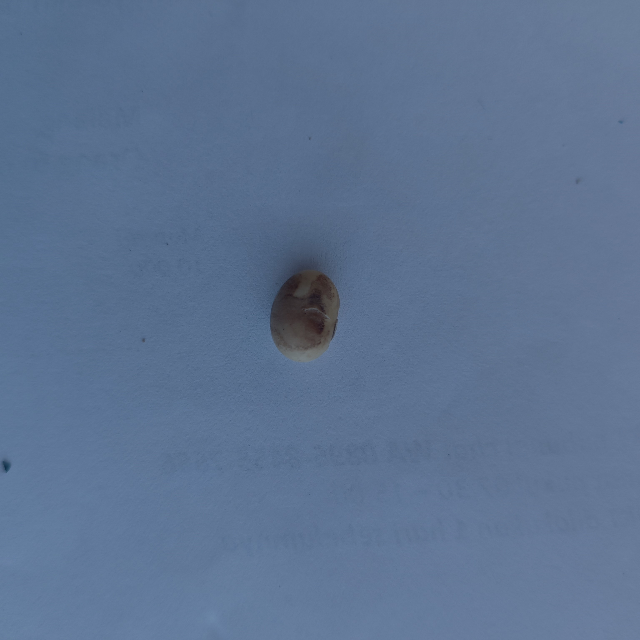

=== KEDELAI CAHAYA NORMAL ===


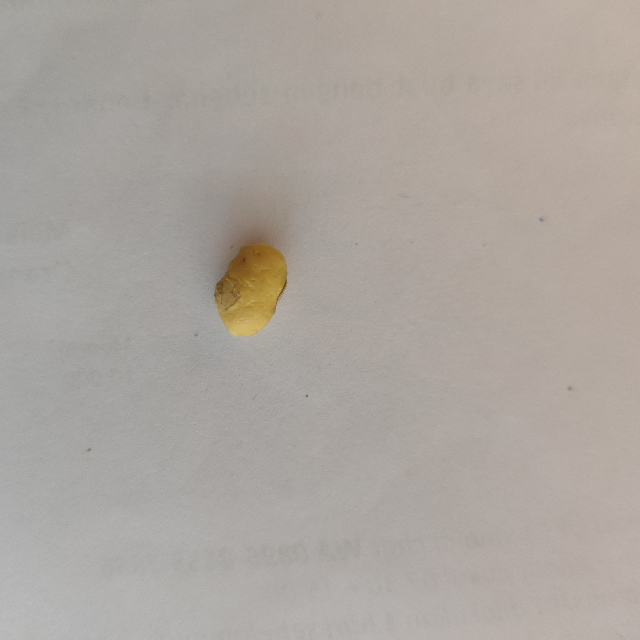

=== KEDELAI CAHAYA SAMPING ===


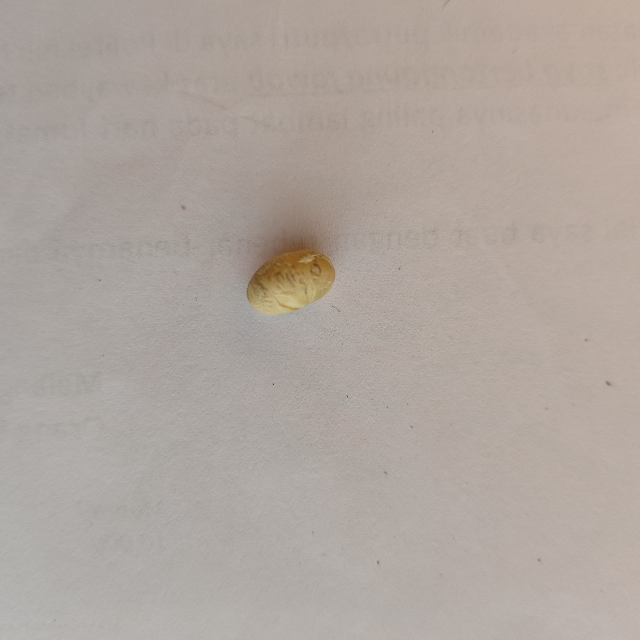

In [ ]:
# ====== resize ======
img_gelap = cv2.imread('/content/drive/MyDrive/PCVK/kedelai_cahayagelap.jpg')
img_normal = cv2.imread('/content/drive/MyDrive/PCVK/kedelai_cahayanormal.jpg')
img_samping = cv2.imread('/content/drive/MyDrive/PCVK/kedelai_cahayasamping.jpg')

img_gelap = cv2.resize(img_gelap, (640, 640))
img_normal = cv2.resize(img_normal, (640, 640))
img_samping = cv2.resize(img_samping, (640, 640))

print("=== KEDELAI CAHAYA GELAP ===")
cv2_imshow(img_gelap)

print("=== KEDELAI CAHAYA NORMAL ===")
cv2_imshow(img_normal)

print("=== KEDELAI CAHAYA SAMPING ===")
cv2_imshow(img_samping)

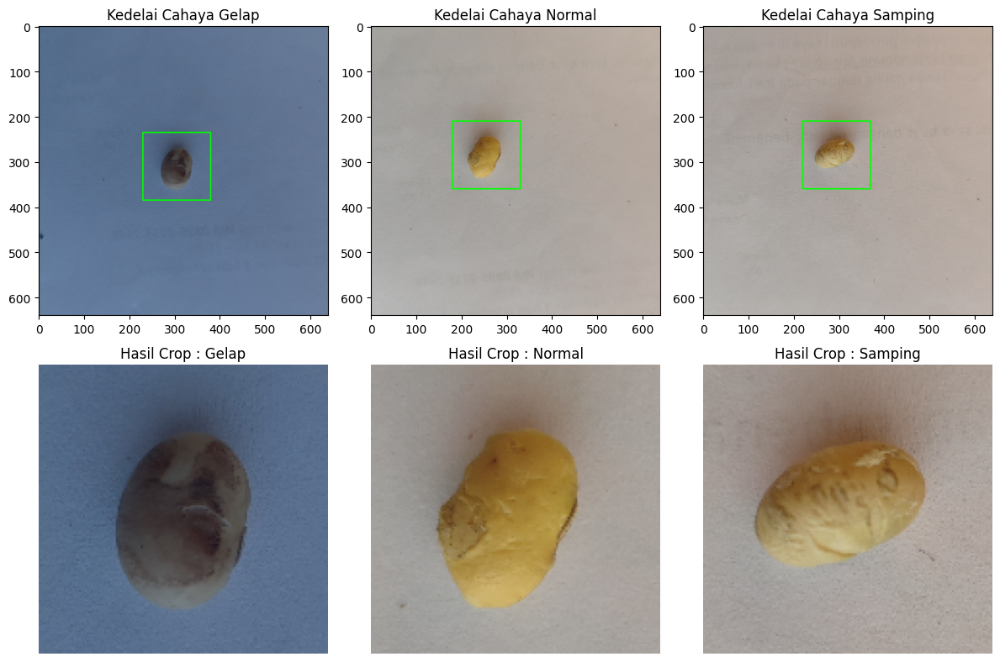

In [ ]:
# === KOORDINAT X, Y, WIDTH, HEIGHT ===
bbox = {
    "gelap":   (230, 235, 150, 150),
    "normal":  (180, 210, 150, 150),
    "samping": (220, 210, 150, 150)
}

images = [
    ("gelap", "Kedelai Cahaya Gelap", img_gelap.copy(), bbox["gelap"]),
    ("normal", "Kedelai Cahaya Normal", img_normal.copy(), bbox["normal"]),
    ("samping", "Kedelai Cahaya Samping", img_samping.copy(), bbox["samping"])
]

hasil_crop = {}

fig, axs = plt.subplots(2, 3, figsize=(12, 8))

for i, (key, title, img, (x, y, w, h)) in enumerate(images):
    img_box = img.copy()
    cv2.rectangle(img_box, (x, y), (x+w, y+h), (0,255,0), 2)

    # crop hasil
    crop = img[y:y+h, x:x+w]
    hasil_crop[key] = crop

    axs[0, i].imshow(cv2.cvtColor(img_box, cv2.COLOR_BGR2RGB))
    axs[0, i].set_title(title)
    axs[0, i].axis('ON')

    axs[1, i].imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
    axs[1, i].set_title(f"Hasil Crop : {key.capitalize()}")
    axs[1, i].axis('off')

plt.tight_layout()
plt.show()


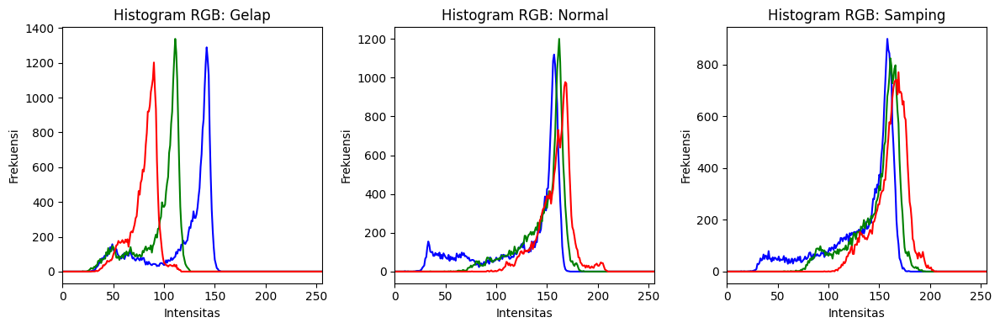

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(12, 4))
titles = ["gelap", "normal", "samping"]

for i, key in enumerate(titles):
    crop = hasil_crop[key]

    # Hitung histogram RGB
    colors = ('b', 'g', 'r')
    for j, col in enumerate(colors):
        hist = cv2.calcHist([crop], [j], None, [256], [0, 256])
        axs[i].plot(hist, color=col)

    axs[i].set_title(f"Histogram RGB: {key.capitalize()}")
    axs[i].set_xlabel("Intensitas")
    axs[i].set_ylabel("Frekuensi")
    axs[i].set_xlim([0, 256])

plt.tight_layout()
plt.show()

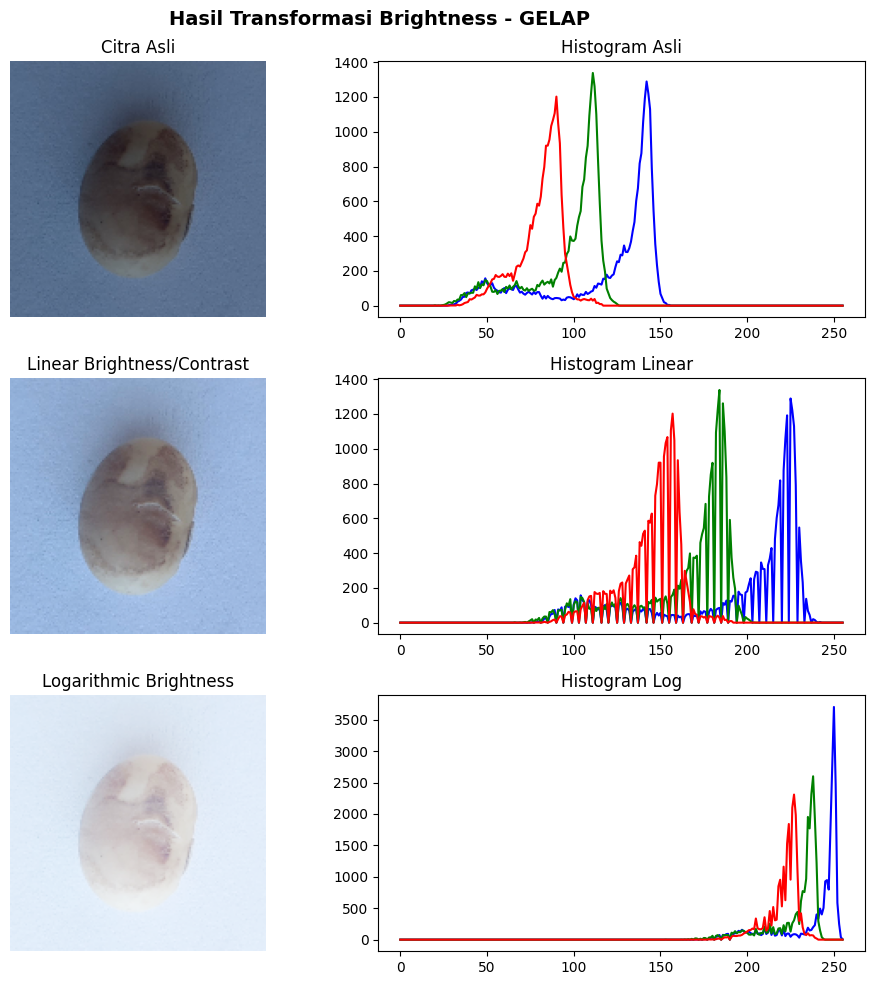

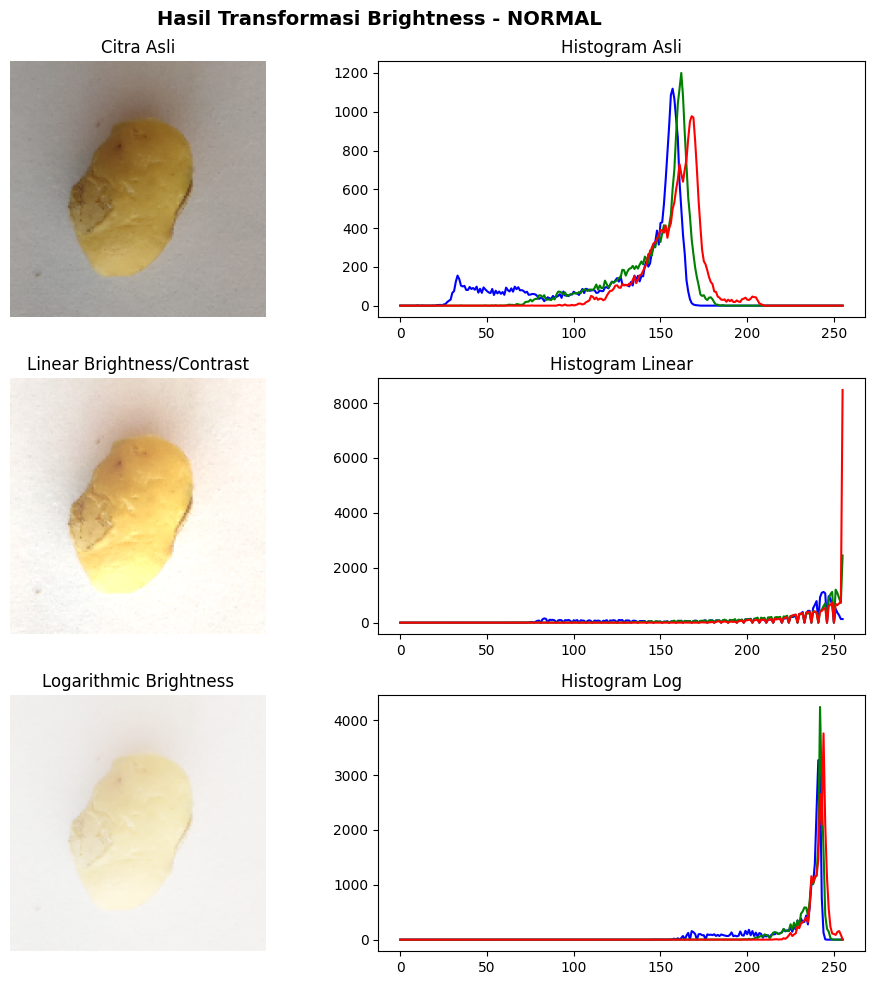

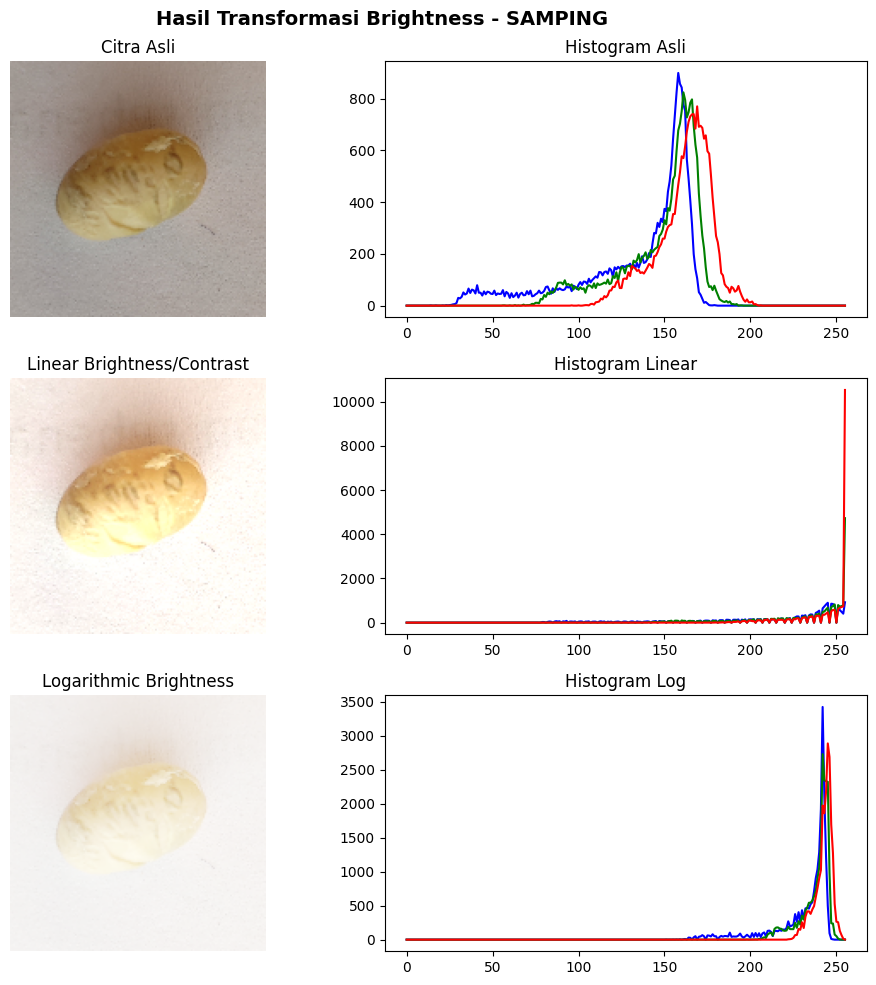

In [ ]:
# === Fungsi transformasi linear (brightness & contrast) ===
def adjust_linear(img, alpha=1.2, beta=30):
    adjusted = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)
    return adjusted

# === Fungsi transformasi log brightness ===
def adjust_log(img):
    img_float = img.astype(np.float32)
    c = 255 / np.log(1 + np.max(img_float))
    log_transformed = c * np.log(1 + img_float)
    log_transformed = np.array(log_transformed, dtype=np.uint8)
    return log_transformed


# === Tampilkan hasil transformasi dan histogram ===
for key, crop_img in hasil_crop.items():
    # transformasi brightness
    linear_img = adjust_linear(crop_img, alpha=1.3, beta=40)
    log_img = adjust_log(crop_img)

    # buat figure untuk tiap kategori
    fig, axs = plt.subplots(3, 2, figsize=(10, 10))
    fig.suptitle(f"Hasil Transformasi Brightness - {key.upper()}", fontsize=14, fontweight='bold')

    # ===== Asli =====
    axs[0, 0].imshow(cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB))
    axs[0, 0].set_title("Citra Asli")
    axs[0, 0].axis('off')

    # Histogram Asli
    for i, col in enumerate(('b', 'g', 'r')):
        axs[0, 1].plot(cv2.calcHist([crop_img], [i], None, [256], [0, 256]), color=col)
    axs[0, 1].set_title("Histogram Asli")

    # ===== Linear =====
    axs[1, 0].imshow(cv2.cvtColor(linear_img, cv2.COLOR_BGR2RGB))
    axs[1, 0].set_title("Linear Brightness/Contrast")
    axs[1, 0].axis('off')

    # Histogram Linear
    for i, col in enumerate(('b', 'g', 'r')):
        axs[1, 1].plot(cv2.calcHist([linear_img], [i], None, [256], [0, 256]), color=col)
    axs[1, 1].set_title("Histogram Linear")

    # ===== Log =====
    axs[2, 0].imshow(cv2.cvtColor(log_img, cv2.COLOR_BGR2RGB))
    axs[2, 0].set_title("Logarithmic Brightness")
    axs[2, 0].axis('off')

    # Histogram Log
    for i, col in enumerate(('b', 'g', 'r')):
        axs[2, 1].plot(cv2.calcHist([log_img], [i], None, [256], [0, 256]), color=col)
    axs[2, 1].set_title("Histogram Log")

    plt.tight_layout()
    plt.show()


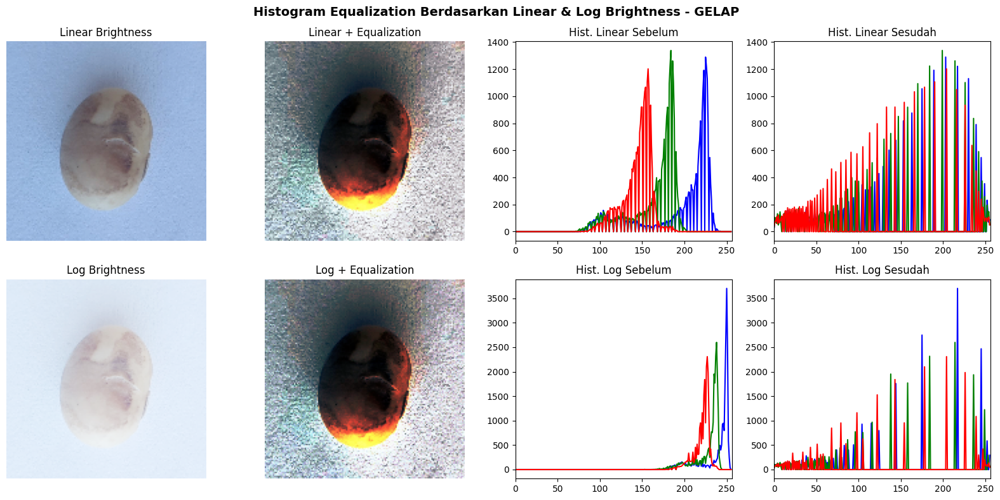

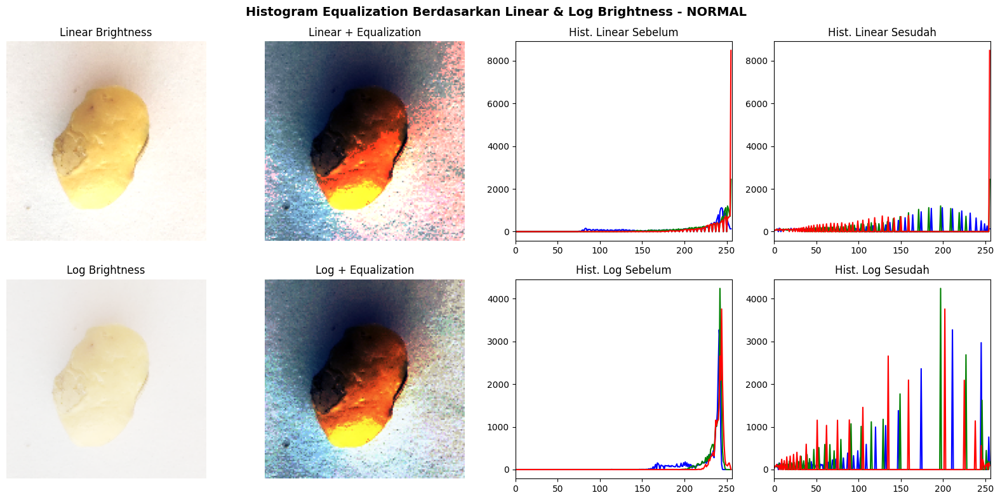

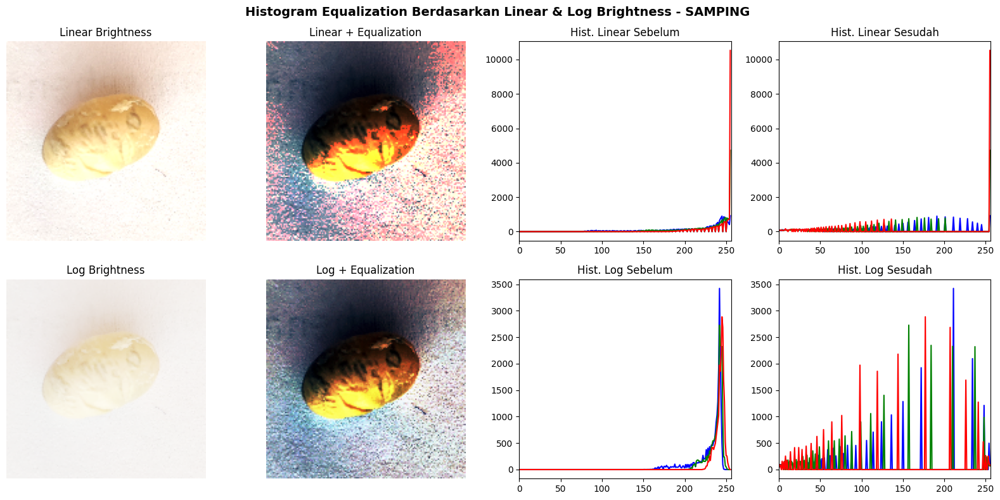

In [ ]:
# Linear Brightness + contrast
def adjust_linear(img, alpha=1.3, beta=40):
    return cv2.convertScaleAbs(img, alpha=alpha, beta=beta)

# Log brightness
def adjust_log(img):
    img_float = img.astype(np.float32)
    c = 255 / np.log(1 + np.max(img_float))
    log_transformed = c * np.log(1 + img_float)
    return np.array(log_transformed, dtype=np.uint8)

# Histogram equalization
def equalize_rgb(img):
    b, g, r = cv2.split(img)
    eq_b = cv2.equalizeHist(b)
    eq_g = cv2.equalizeHist(g)
    eq_r = cv2.equalizeHist(r)
    return cv2.merge((eq_b, eq_g, eq_r))

# PERBANDINGAN
for key, crop_img in hasil_crop.items():

    # transformasi brightness
    linear_img = adjust_linear(crop_img, alpha=1.3, beta=40)
    log_img = adjust_log(crop_img)

    # equalization
    eq_linear = equalize_rgb(linear_img)
    eq_log = equalize_rgb(log_img)

    fig, axs = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f"Histogram Equalization Berdasarkan Linear & Log Brightness - {key.upper()}", fontsize=14, fontweight='bold')

    # --- 1. Linear Brightness ---
    axs[0, 0].imshow(cv2.cvtColor(linear_img, cv2.COLOR_BGR2RGB))
    axs[0, 0].set_title("Linear Brightness")
    axs[0, 0].axis('off')

    axs[0, 1].imshow(cv2.cvtColor(eq_linear, cv2.COLOR_BGR2RGB))
    axs[0, 1].set_title("Linear + Equalization")
    axs[0, 1].axis('off')

    # Histogram sebelum (linear)
    for i, col in enumerate(('b', 'g', 'r')):
        hist = cv2.calcHist([linear_img], [i], None, [256], [0,256])
        axs[0, 2].plot(hist, color=col)
    axs[0, 2].set_title("Hist. Linear Sebelum")
    axs[0, 2].set_xlim([0,256])

    # Histogram sesudah (linear)
    for i, col in enumerate(('b', 'g', 'r')):
        hist_eq = cv2.calcHist([eq_linear], [i], None, [256], [0,256])
        axs[0, 3].plot(hist_eq, color=col)
    axs[0, 3].set_title("Hist. Linear Sesudah")
    axs[0, 3].set_xlim([0,256])

    # --- 2. Log Brightness ---
    axs[1, 0].imshow(cv2.cvtColor(log_img, cv2.COLOR_BGR2RGB))
    axs[1, 0].set_title("Log Brightness")
    axs[1, 0].axis('off')

    axs[1, 1].imshow(cv2.cvtColor(eq_log, cv2.COLOR_BGR2RGB))
    axs[1, 1].set_title("Log + Equalization")
    axs[1, 1].axis('off')

    # Histogram sebelum (log)
    for i, col in enumerate(('b', 'g', 'r')):
        hist_log = cv2.calcHist([log_img], [i], None, [256], [0,256])
        axs[1, 2].plot(hist_log, color=col)
    axs[1, 2].set_title("Hist. Log Sebelum")
    axs[1, 2].set_xlim([0,256])

    # Histogram sesudah (log)
    for i, col in enumerate(('b', 'g', 'r')):
        hist_log_eq = cv2.calcHist([eq_log], [i], None, [256], [0,256])
        axs[1, 3].plot(hist_log_eq, color=col)
    axs[1, 3].set_title("Hist. Log Sesudah")
    axs[1, 3].set_xlim([0,256])

    plt.tight_layout()
    plt.show()

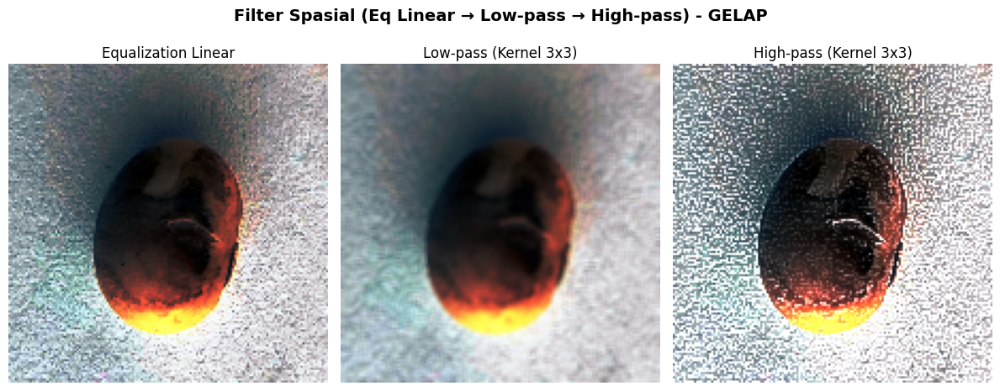

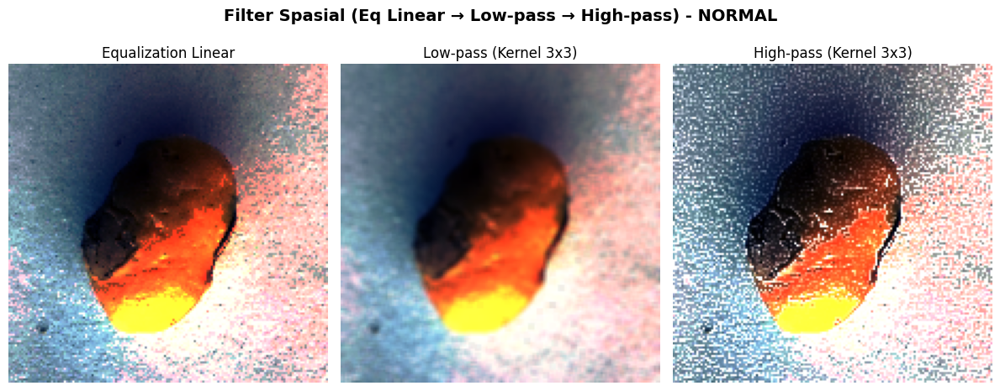

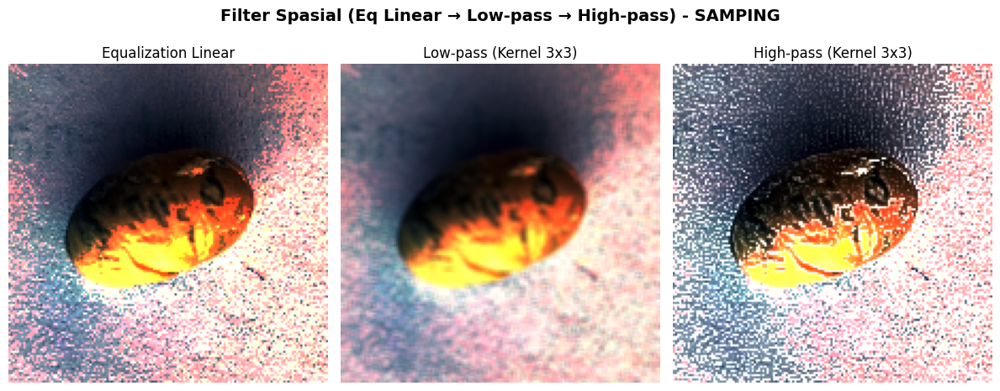

In [34]:
# Low-pass dan high-pass filter (3x3)
def apply_low_pass(img, blur_strength=None):
    # Kernel low-pass 3x3 sederhana (average filter)
    kernel = np.ones((3, 3), np.float32) / 9
    low_pass = cv2.filter2D(img, -1, kernel)
    return low_pass

def apply_high_pass(img):
    # Kernel high-pass 3x3 sederhana
    kernel = np.array([[-1, -1, -1],
                       [-1,  8, -1],
                       [-1, -1, -1]])
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    high_pass = cv2.filter2D(gray, -1, kernel)
    sharpened = cv2.addWeighted(img, 1, cv2.cvtColor(high_pass, cv2.COLOR_GRAY2BGR), 1, 0)
    return sharpened


# Parameter blurring
blur_strength = 4
if blur_strength % 2 == 0:
    blur_strength += 1

# === Proses Filter Spasial Berdasarkan Hasil Equalization Linear ===
for key, crop_img in hasil_crop.items():
    # Step 1: Linear brightness + equalization
    eq_linear = equalize_rgb(adjust_linear(crop_img, alpha=1.3, beta=40))

    # Step 2: Low-pass filter (kernel 3x3)
    low_pass = apply_low_pass(eq_linear, blur_strength)

    # Step 3: High-pass filter (kernel 3x3)
    high_pass = apply_high_pass(eq_linear)

    # === Visualisasi ===
    fig, axs = plt.subplots(1, 3, figsize=(12, 5))
    fig.suptitle(f"Filter Spasial (Eq Linear → Low-pass → High-pass) - {key.upper()}",
                 fontsize=14, fontweight='bold')

    axs[0].imshow(cv2.cvtColor(eq_linear, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Equalization Linear")
    axs[0].axis('off')

    axs[1].imshow(cv2.cvtColor(low_pass, cv2.COLOR_BGR2RGB))
    axs[1].set_title("Low-pass (Kernel 3x3)")
    axs[1].axis('off')

    axs[2].imshow(cv2.cvtColor(high_pass, cv2.COLOR_BGR2RGB))
    axs[2].set_title("High-pass (Kernel 3x3)")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()


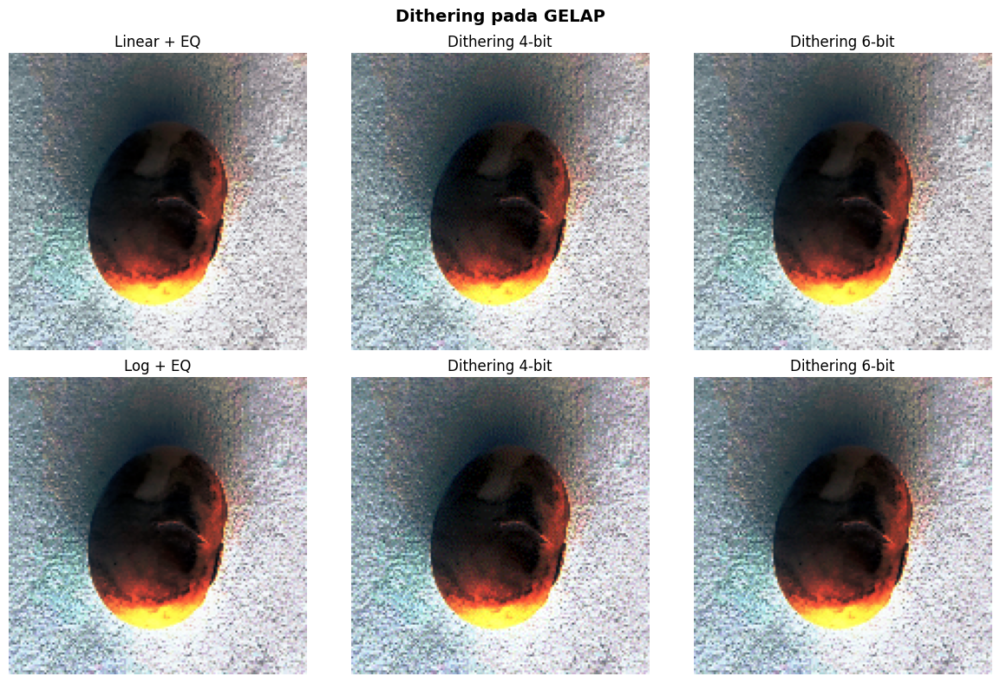

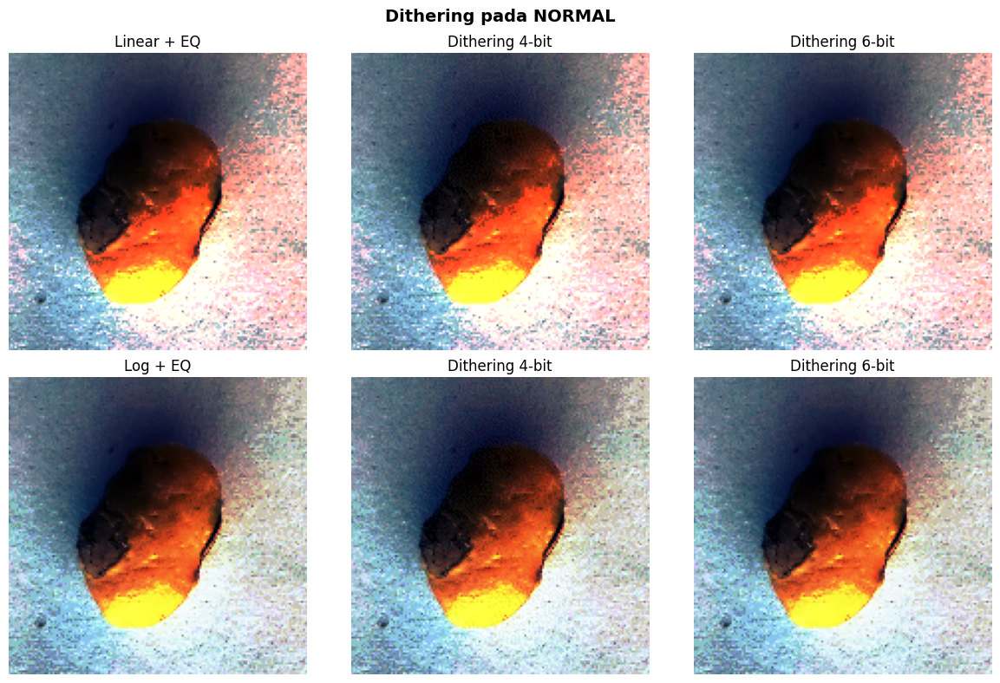

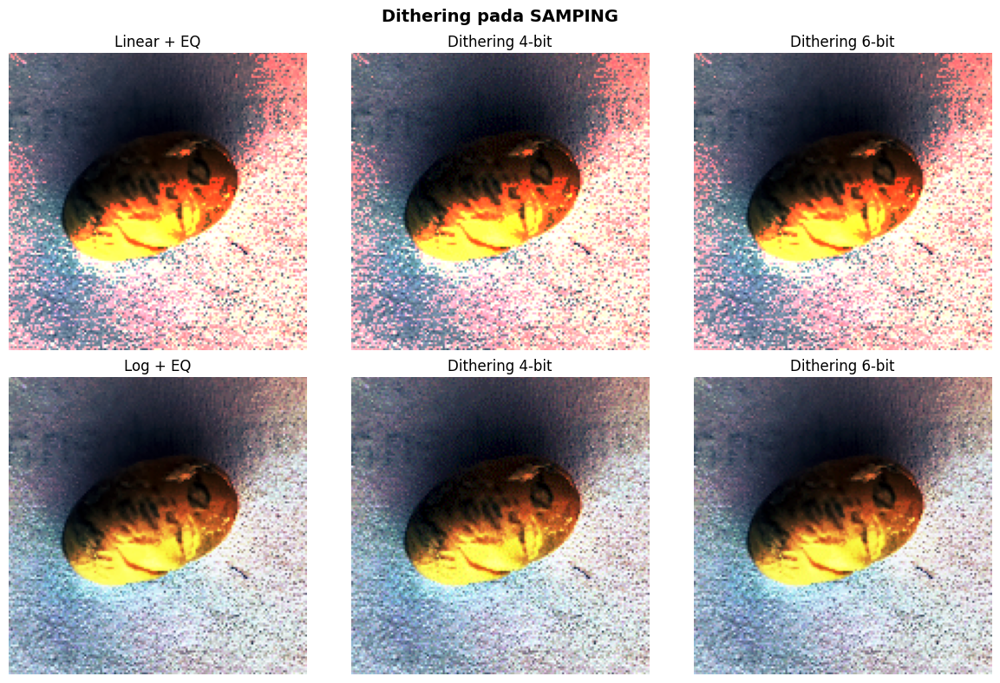

In [35]:
# === Fungsi Floyd–Steinberg Dithering ===
def dithering(img, bit_depth):
    img = img.astype(np.float32)
    max_val = 2 ** bit_depth - 1

    h, w, c = img.shape
    for y in range(h - 1):
        for x in range(1, w - 1):
            for ch in range(c):
                old = img[y, x, ch]
                new = round(old * max_val / 255) * (255 / max_val)
                err = old - new
                img[y, x, ch] = new
                img[y, x+1, ch] += err * 7/16
                img[y+1, x-1, ch] += err * 3/16
                img[y+1, x, ch] += err * 5/16
                img[y+1, x+1, ch] += err * 1/16

    return np.clip(img, 0, 255).astype(np.uint8)

# === Proses dithering berdasarkan hasil equalization sebelumnya ===
for key, crop_img in hasil_crop.items():
    # Gunakan hasil equalization (linear dan log)
    eq_linear = equalize_rgb(adjust_linear(crop_img))
    eq_log = equalize_rgb(adjust_log(crop_img))

    # Terapkan dithering 4-bit dan 6-bit
    d4_linear = dithering(eq_linear, 4)
    d6_linear = dithering(eq_linear, 6)
    d4_log = dithering(eq_log, 4)
    d6_log = dithering(eq_log, 6)

    # Hasil
    fig, axs = plt.subplots(2, 3, figsize=(12, 8))
    fig.suptitle(f"Dithering pada {key.upper()}", fontsize=14, fontweight='bold')

    # Linear + EQ
    axs[0, 0].imshow(cv2.cvtColor(eq_linear, cv2.COLOR_BGR2RGB))
    axs[0, 0].set_title("Linear + EQ")
    axs[0, 0].axis('off')

    axs[0, 1].imshow(cv2.cvtColor(d4_linear, cv2.COLOR_BGR2RGB))
    axs[0, 1].set_title("Dithering 4-bit")
    axs[0, 1].axis('off')

    axs[0, 2].imshow(cv2.cvtColor(d6_linear, cv2.COLOR_BGR2RGB))
    axs[0, 2].set_title("Dithering 6-bit")
    axs[0, 2].axis('off')

    # Log + EQ
    axs[1, 0].imshow(cv2.cvtColor(eq_log, cv2.COLOR_BGR2RGB))
    axs[1, 0].set_title("Log + EQ")
    axs[1, 0].axis('off')

    axs[1, 1].imshow(cv2.cvtColor(d4_log, cv2.COLOR_BGR2RGB))
    axs[1, 1].set_title("Dithering 4-bit")
    axs[1, 1].axis('off')

    axs[1, 2].imshow(cv2.cvtColor(d6_log, cv2.COLOR_BGR2RGB))
    axs[1, 2].set_title("Dithering 6-bit")
    axs[1, 2].axis('off')

    plt.tight_layout()
    plt.show()

# BAGIAN B - ANALISIS

1.Bagaimana perubahan nilai brightness dan contrast memengaruhi hasil histogram
wajah/objek gelap?

> Pada citra asli, objek terlihat gelap akibat pencahayaan yang rendah, dimana histogram menunjukan sebagian besar nilai intensitas pada rentang rendah 50 - 130. Hal ini menandakan dominasi warna gelap dan minimnya distribusi kecerahan, sehingga detail permukaan objek sulit terlihat dengan jelas. Setelah dilakukan transformasi linear brigtness dan contrast citra menjadi lebih cerah dengan peningkatan kontras yang merata diseluruh area gambar. pergeseran histogram ke arah kanan menunjukan bahwa tingkat kecerahan meningkat secara global, sementara persebaran nilai RGB yang lebih besar menandakan peningkatan kontras antar warna sehingga tektur objek menjadi lebih terlihat.

> Sementara itu, transformasi logarithmic brightness memberi efek peningkatan kecerahan yang bersifat non-linear. Perubahan ini menonjol pada area gelap tanpa membuat area terang menjadi terlalu pucat. Histogram menyebar ke area tinggi (200 - 250), yang menunjukan bahwa piksel gelap telah ditingkatkan secara signifikan. Akibatnya, detail halus dan area bayangan menjadi lebih jelas meskipun kontras keseluruhan sedikit menurun.

2. Apakah histogram equalization selalu memperbaiki detail wajah/objek? Jelaskan alasannya dengan contoh hasil Anda.

> Histogram equalization tidak selalu memperbaiki detail objek, tergantung pada kondisi pencahayaan dan distribusi intensitas awal citra. Pada hasil pengerjaan sebelumnya, terlihat bahwa setelah dilakukan equalization pada linear brigtness, citra lebih kontras dan area gelap terlihat lebih jelas. Namun, bagian terang justru menjadi over-enhanced, sehingga beberapa detail halus pada permukaan objek hilang.

3. Bandingkan hasil low-pass dan high-pass filter pada area wajah/objek — bagian mana yang paling terpengaruh?

> Pada hasil penerapan low-pass dan high-pass terlihat perbedaan yang signifikan pada area objek, yang dimana pada low-pass filter menghasilkan citra yang lebih halus dengan mengurangi detail tajak dan tekstur halus pada permukaan objek. Area benih tampak lebih lembut, tetapi batas antara objek dan latar belakang menjadi kurang tegas.
> Sebaliknya, high-pass filter (laplacian) memperjelas tepi dan kontur objek, membuat batas dan detail kecil lebih menonjol. Namun, efeknya juga membuat area gelap tampak kontras dan kasar.
> Dengan demikian, bagian yang paling terpengaruh oleh low-pass filter adalah tekstur halus dan gradasi warna, sedangkan pada high-pass filter yang paling terpengaruh adalah batas tepi dan area transisi antar warna atau cahaya.

4. Mengapa proses dithering bisa mempertegas atau justru mengaburkan ekspresi wajah/objek?
> Karena efek dithering bersifat dua arah yang dimana dapat memperjelas detail jika dilakukan dengan pengaturan tepat, namun dapat pula mengaburkan tampilan jika tingkat kuantisasi warnanya terlalu kasar.

5. Berdasarkan hasil percobaan Anda, kombinasi teknik mana yang paling efektif untuk meningkatkan readability fitur wajah sebelum tahap deteksi?

> Berdasarkan hasil percobaan, kombnasi teknik paling efektif untuk meningkatkan readability adalah Linear brigtness, histogram equalization, high-pass filter.

> Alasannya pada percobaan menggunakan linear brightness meningkatkan pencahayaan global pada citra gelap sehingga area objek tampak lebih terlihat jelas

> pada percobaan menggunakan histogram equalization mendistribusikan intensitas cahaya secara merata diseluruh citra, menonjolkan perbedaan antara bagian terang dan gelap. ini membantu menonjolkan kontur wajah serta perbedaan tekstur.

> pada percobaan menggunakan high-pass filter (laplacian) memperkuat tepi dan detail kecil seperti batas atau lekukan pada permukaan objek yang sangat penting dalam proses deteksi fitur.

<Figure size 1800x1000 with 0 Axes>

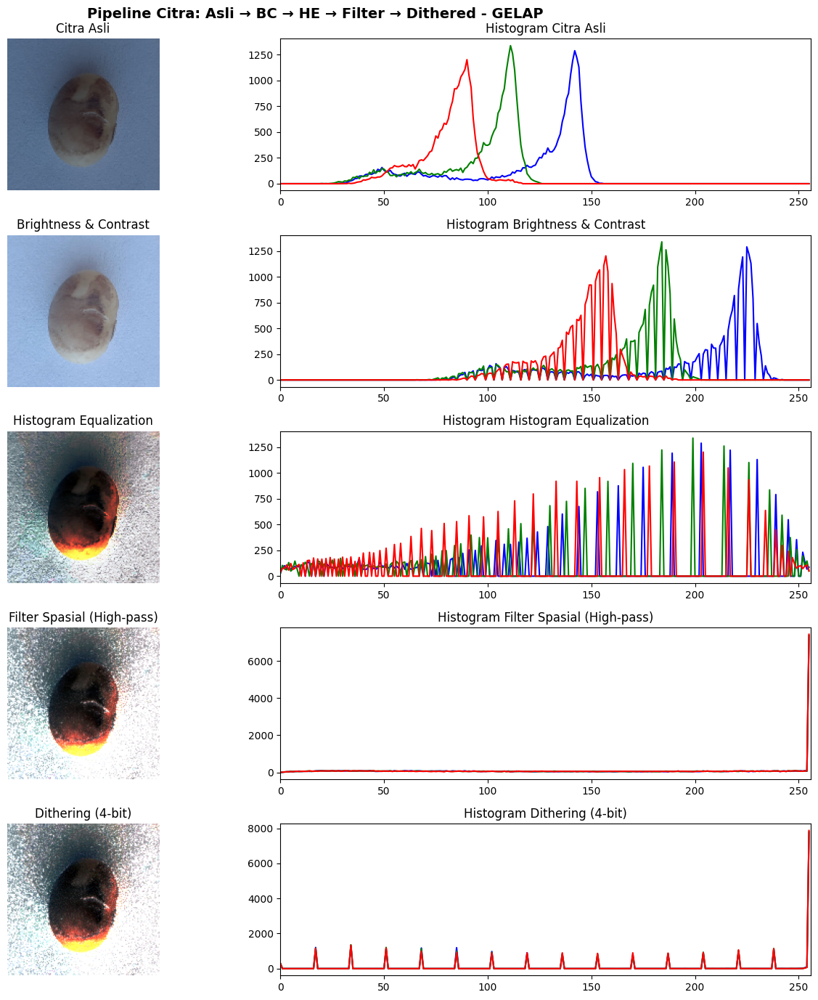

<Figure size 1800x1000 with 0 Axes>

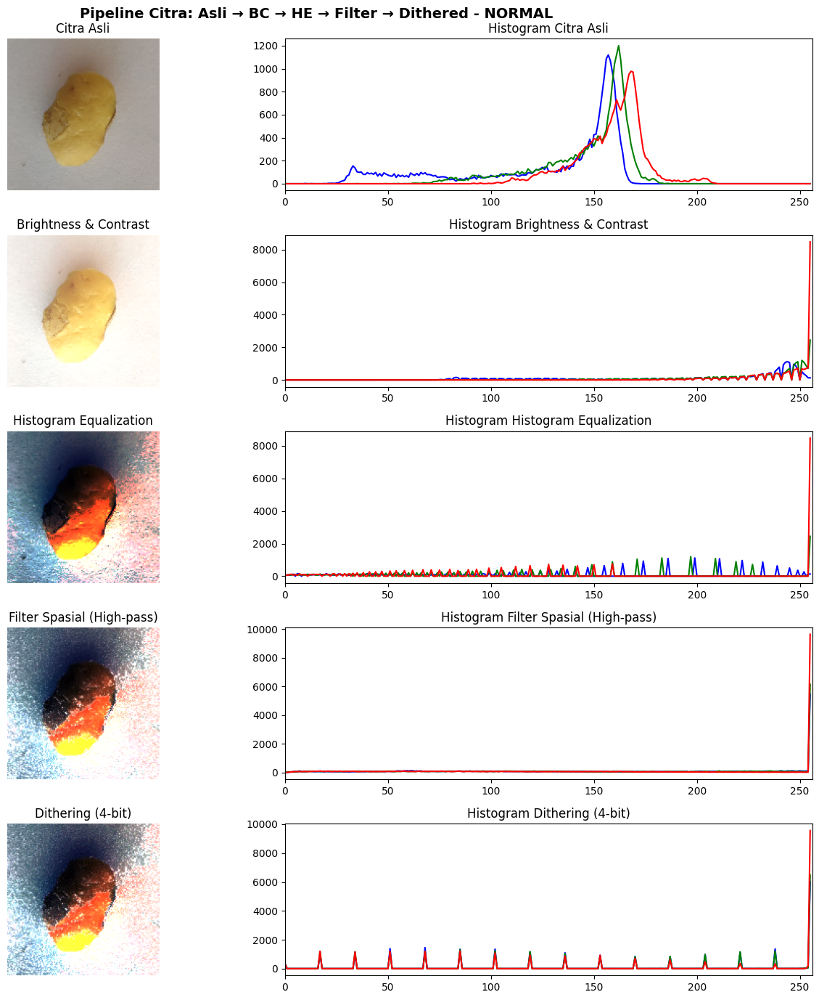

<Figure size 1800x1000 with 0 Axes>

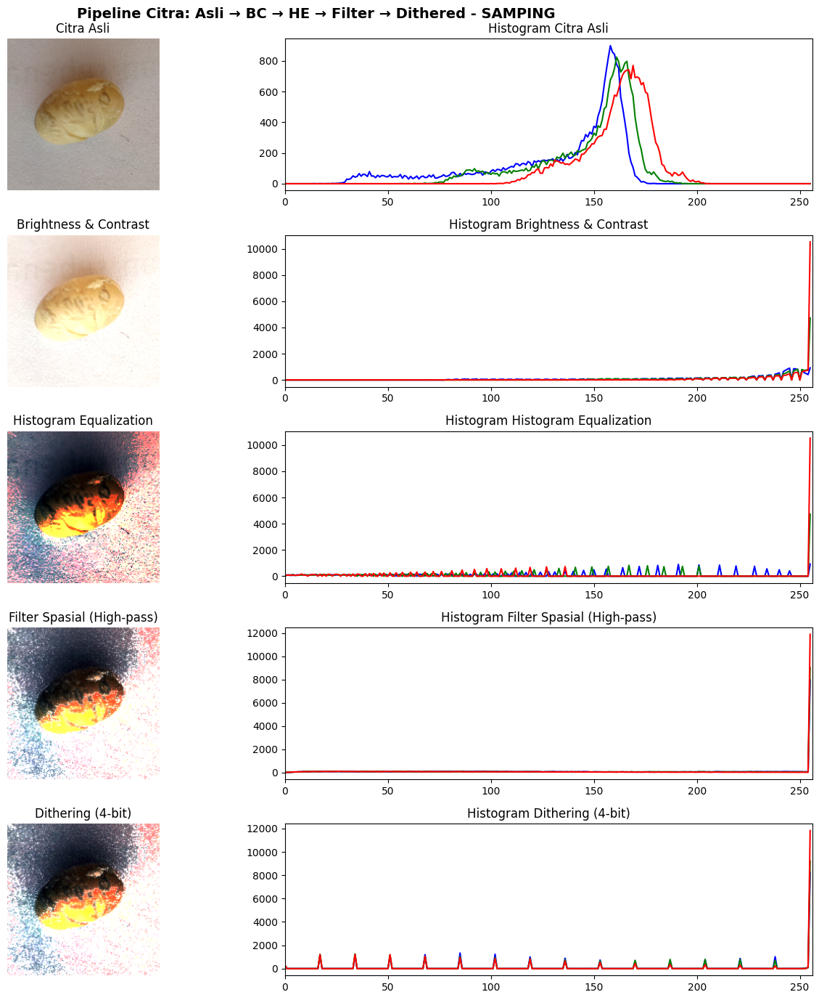

In [ ]:
# === Pipeline ===
for key, crop_img in hasil_crop.items():
    # Step 1: Asli
    original = crop_img

    # Step 2: Brightness Contrast
    bc_img = adjust_linear(original)

    # Step 3: Histogram Equalization
    eq_img = equalize_rgb(bc_img)

    # Step 4: Filter Spasial (High-pass Laplacian)
    filtered_img = apply_high_pass(eq_img)

    # Step 5: Dithering (4-bit)
    dithered_img = dithering(filtered_img, 4)

    # === 6. Visualisasi pipeline ===
    stages = [original, bc_img, eq_img, filtered_img, dithered_img]
    titles = [
        "Citra Asli",
        "Brightness & Contrast",
        "Histogram Equalization",
        "Filter Spasial (High-pass)",
        "Dithering (4-bit)"
    ]

    plt.figure(figsize=(18, 10))
    fig, axs = plt.subplots(5, 2, figsize=(14, 14))
    fig.suptitle(f"Pipeline Citra: Asli → BC → HE → Filter → Dithered : {key.upper()}",
                 fontsize=14, fontweight='bold')

    for i, img_stage in enumerate(stages):
        # tampilkan citra
        axs[i, 0].imshow(cv2.cvtColor(img_stage, cv2.COLOR_BGR2RGB))
        axs[i, 0].set_title(titles[i])
        axs[i, 0].axis('off')

        # tampilkan histogram RGB
        for j, col in enumerate(('b', 'g', 'r')):
            hist = cv2.calcHist([img_stage], [j], None, [256], [0, 256])
            axs[i, 1].plot(hist, color=col)
        axs[i, 1].set_xlim([0, 256])
        axs[i, 1].set_title(f"Histogram {titles[i]}")

    plt.tight_layout()
    plt.show()

=== Nilai PSNR (dB) terhadap citra asli ===


,BC,HE,Filter,Dither
gelap,11.22,11.58,8.23,8.22
normal,9.82,12.23,11.36,11.34
samping,9.81,11.73,10.79,10.78


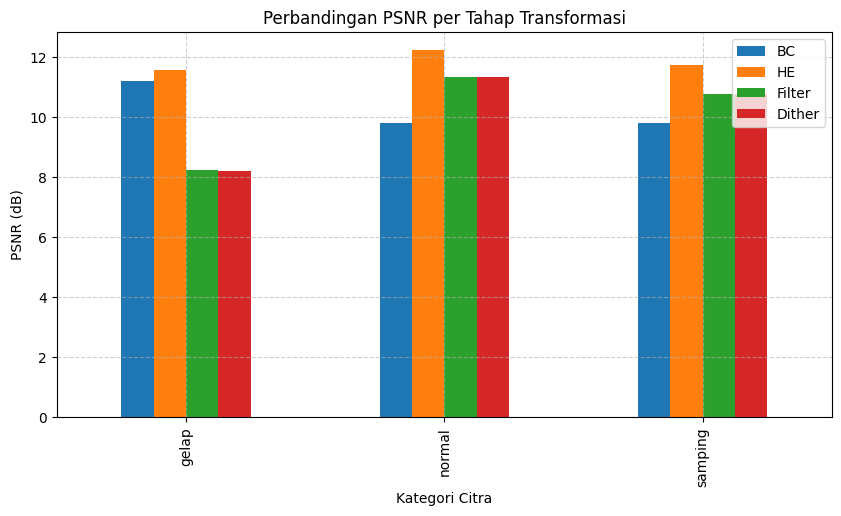

In [29]:
from skimage.metrics import peak_signal_noise_ratio as psnr

# === PSNR Setiap Tahap ===
psnr_results = {}

for key, crop_img in hasil_crop.items():
    # Tahap 1: Brightness & Contrast
    bc_img = adjust_linear(crop_img)

    # Tahap 2: Histogram Equalization
    he_img = equalize_rgb(bc_img)

    # Tahap 3: High-pass Filter
    filtered_img = apply_high_pass(he_img)

    # Tahap 4: Dithering (4-bit)
    dither_img = dithering(filtered_img, bit_depth=4)

    # Hitung PSNR terhadap citra asli
    psnr_results[key] = {
        "BC": psnr(crop_img, bc_img),
        "HE": psnr(crop_img, he_img),
        "Filter": psnr(crop_img, filtered_img),
        "Dither": psnr(crop_img, dither_img)
    }

# === Tampilkan Hasil PSNR ===
import pandas as pd

df_psnr = pd.DataFrame(psnr_results).T
df_psnr = df_psnr.round(2)
print("=== Nilai PSNR (dB) terhadap citra asli ===")
display(df_psnr)

# === Visualisasi Bar Chart ===
df_psnr.plot(kind='bar', figsize=(10,5), title="Perbandingan PSNR per Tahap Transformasi")
plt.ylabel("PSNR (dB)")
plt.xlabel("Kategori Citra")
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


**KESIMPULAN** :

- Brightness/Contrast (BC)
Nilai PSNR berkisar 9–11 dB, menunjukkan bahwa penyesuaian kontras dan kecerahan menghasilkan perubahan cukup besar dari citra asli. Namun, perubahan ini diperlukan untuk meningkatkan visibilitas objek pada citra gelap atau terlalu terang.

- Histogram Equalization (HE)
PSNR sedikit lebih tinggi, terutama pada citra normal (12.23 dB). Ini berarti proses redistribusi intensitas membantu menyeimbangkan pencahayaan tanpa terlalu merusak struktur asli. Dengan kata lain, HE meningkatkan kontras lokal sambil menjaga informasi penting.

- Filter Spasial (High-pass)
Nilai PSNR cenderung menurun pada citra gelap (8.23 dB) namun lebih stabil pada normal dan samping (sekitar 11 dB). Hal ini karena high-pass menonjolkan tepi dan mengurangi area halus, sehingga menambah perbedaan terhadap citra asli.

- Dithering (4-bit)
PSNR paling rendah di semua kategori (~8–11 dB), karena proses ini mengurangi kedalaman warna dan menambahkan noise terkontrol untuk mempertahankan ilusi gradasi. Walau menurunkan PSNR, dithering justru berguna untuk mempertajam tepi visual atau pola pada tahap akhir pra-pengenalan (recognition).

- Nilai PSNR tinggi menandakan hasil transformasi masih mirip dengan citra asli (minim distorsi).

- Nilai PSNR rendah menandakan transformasi menghasilkan perubahan besar (kontras tinggi, tepi tajam, atau reduksi warna).

- Dalam konteks pra-pengolahan citra untuk deteksi objek, PSNR tidak harus tinggi, karena beberapa tahap seperti equalization dan dithering memang bertujuan memperjelas fitur visual, bukan menjaga kesamaan warna dengan citra asli.